In [ ]:
#Movie Recommendation System using collaberative filtering(pearson method of correlation)

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [20]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth',None)

In [21]:
df_rating=pd.read_csv('rate.csv')
df_movies=pd.read_csv('movies.csv')


In [22]:
df_rating.head()

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247
2,1,6,4.0,964982224
3,1,47,5.0,964983815
4,1,50,5.0,964982931


In [23]:
#run this cell to choose(copy) movies and paste it in the last column to get recommendations
df_movies

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy
5,6,Heat (1995),Action|Crime|Thriller
6,7,Sabrina (1995),Comedy|Romance
7,8,Tom and Huck (1995),Adventure|Children
8,9,Sudden Death (1995),Action
9,10,GoldenEye (1995),Action|Adventure|Thriller


In [24]:
df=pd.merge(df_rating,df_movies,on='movieId')

In [25]:
df.head()

,userId,movieId,rating,timestamp,title,genres
0,1,1,4.0,964982703,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,5,1,4.0,847434962,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
2,7,1,4.5,1106635946,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
3,15,1,2.5,1510577970,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
4,17,1,4.5,1305696483,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy


In [26]:
ratings=pd.DataFrame(df.groupby('title')['rating'].mean())

In [27]:
ratings.head()

,rating
title,
'71 (2014),4.0
'Hellboy': The Seeds of Creation (2004),4.0
'Round Midnight (1986),3.5
'Salem's Lot (2004),5.0
'Til There Was You (1997),4.0


In [28]:
ratings['no. of ratings']=pd.DataFrame(df.groupby('title')['rating'].count())

In [29]:
ratings.head()

,rating,no. of ratings
title,,
'71 (2014),4.0,1
'Hellboy': The Seeds of Creation (2004),4.0,1
'Round Midnight (1986),3.5,2
'Salem's Lot (2004),5.0,1
'Til There Was You (1997),4.0,2


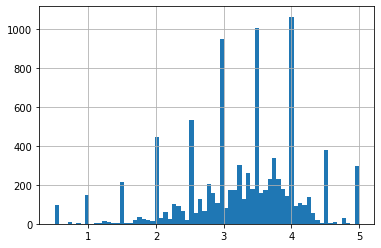

In [33]:
ratings['rating'].hist(bins=70)
#number of ratings

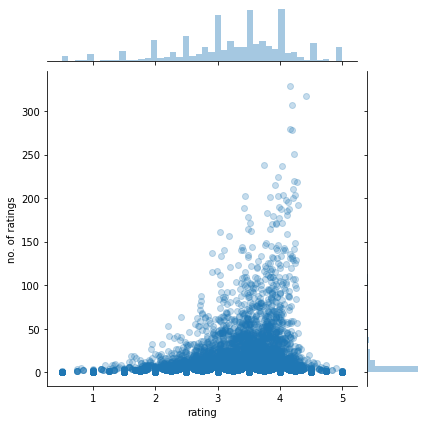

In [34]:
sns.jointplot(x='rating',y='no. of ratings',data=ratings,alpha=0.25)

In [35]:
moviemat=df.pivot_table(index='userId',columns='title',values='rating')

In [36]:
moviemat.head()

title,'71 (2014),'Hellboy': The Seeds of Creation (2004),'Round Midnight (1986),'Salem's Lot (2004),'Til There Was You (1997),'Tis the Season for Love (2015),"'burbs, The (1989)",'night Mother (1986),(500) Days of Summer (2009),*batteries not included (1987),...All the Marbles (1981),...And Justice for All (1979),00 Schneider - Jagd auf Nihil Baxter (1994),1-900 (06) (1994),10 (1979),10 Cent Pistol (2015),10 Cloverfield Lane (2016),10 Items or Less (2006),10 Things I Hate About You (1999),10 Years (2011),"10,000 BC (2008)",100 Girls (2000),100 Streets (2016),101 Dalmatians (1996),101 Dalmatians (One Hundred and One Dalmatians) (1961),101 Dalmatians II: Patch's London Adventure (2003),101 Reykjavik (101 Reykjavík) (2000),102 Dalmatians (2000),10th & Wolf (2006),"10th Kingdom, The (2000)","10th Victim, The (La decima vittima) (1965)","11'09""01 - September 11 (2002)",11:14 (2003),"11th Hour, The (2007)",12 Angry Men (1957),12 Angry Men (1997),12 Chairs (1971),12 Chairs (1976),12 Rounds (2009),12 Years a Slave (2013),127 Hours (2010),13 Assassins (Jûsan-nin no shikaku) (2010),13 Ghosts (1960),13 Going on 30 (2004),13 Hours (2016),13 Sins (2014),13 Tzameti (2005),13th (2016),"13th Warrior, The (1999)",1408 (2007),1492: Conquest of Paradise (1992),15 Minutes (2001),16 Blocks (2006),17 Again (2009),1776 (1972),18 Again! (1988),187 (One Eight Seven) (1997),1900 (Novecento) (1976),1941 (1979),1969 (1988),1984 (Nineteen Eighty-Four) (1984),2 Days in New York (2012),2 Days in Paris (2007),2 Days in the Valley (1996),"2 Fast 2 Furious (Fast and the Furious 2, The) (2003)",2 Guns (2013),20 Dates (1998),20 Feet from Stardom (Twenty Feet from Stardom) (2013),20 Million Miles to Earth (1957),"20,000 Days on Earth (2014)","20,000 Leagues Under the Sea (1916)","20,000 Leagues Under the Sea (1954)",200 Cigarettes (1999),2001 Maniacs (2005),2001: A Space Odyssey (1968),2010: The Year We Make Contact (1984),2012 (2009),2046 (2004),2048: Nowhere to Run (2017),21 (2008),21 Grams (2003),21 Jump Street (2012),21 Up (1977),21 and Over (2013),22 Jump Street (2014),24 Hour Party People (2002),25th Hour (2002),27 Dresses (2008),28 Days (2000),28 Days Later (2002),28 Up (1985),28 Weeks Later (2007),3 Days to Kill (2014),3 Extremes (Three... Extremes) (Saam gaang yi) (2004),3 Idiots (2009),3 Ninjas (1992),3 Ninjas Kick Back (1994),3 Ninjas Knuckle Up (1995),3 Ninjas: High Noon On Mega Mountain (1998),3 Women (Three Women) (1977),3 dev adam (Three Giant Men) (1973),3-Iron (Bin-jip) (2004),30 Days of Night (2007),30 Minutes or Less (2011),300 (2007),3000 Miles to Graceland (2001),300: Rise of an Empire (2014),31 (2016),35 Up (1991),"39 Steps, The (1935)",3:10 to Yuma (1957),3:10 to Yuma (2007),4 Little Girls (1997),"4 Months, 3 Weeks and 2 Days (4 luni, 3 saptamâni si 2 zile) (2007)",40 Days and 40 Nights (2002),"40-Year-Old Virgin, The (2005)","400 Blows, The (Les quatre cents coups) (1959)",42 (2013),42 Up (1998),42nd Street (1933),47 Ronin (2013),48 Hrs. (1982),49 Up (2005),5 Centimeters per Second (Byôsoku 5 senchimêtoru) (2007),5 to 7 (2014),"5,000 Fingers of Dr. T, The (1953)",50 First Dates (2004),50/50 (2011),52 Pick-Up (1986),54 (1998),6 Days to Air: The Making of South Park (2011),61* (2001),"6th Day, The (2000)","6th Man, The (Sixth Man, The) (1997)",7 Days in Hell (2015),7 Faces of Dr. Lao (1964),"7th Voyage of Sinbad, The (1958)",8 1/2 (8½) (1963),8 Heads in a Duffel Bag (1997),8 Mile (2002),8 Seconds (1994),8 Women (2002),8 ½ Women (a.k.a. 8 1/2 Women) (a.k.a. Eight and a Half Women) (1999),800 Bullets (800 Balas) (2002),84 Charing Cross Road (1987),8MM (1999),9 (2009),9 1/2 Weeks (Nine 1/2 Weeks) (1986),9/11 (2002),96 Minutes (2011),964 Pinocchio (1991),99 francs (2007),9to5: Days in Porn (a.k.a. 9 to 5: Days in Porn) (2008),A Bad Moms Christmas (2017),A Christmas Story Live! (2017),A Cosmic Christmas (1977),A Detective Story (2003),A Dog's Purpose (2017),A Flintstones Christmas Carol (1994),A German Life (2016),A Home at the End of the World 

In [37]:
moviemat=moviemat.dropna(thresh=20,axis=1).fillna(0,axis=1)

In [38]:
corrMatrix = moviemat.corr(method='pearson')
corrMatrix.head(10)

title                                                   (500) Days of Summer (2009)  \
title                                                                                 
(500) Days of Summer (2009)                                                1.000000   
10 Things I Hate About You (1999)                                          0.273989   
101 Dalmatians (1996)                                                      0.148903   
101 Dalmatians (One Hundred and One Dalmatians) (1961)                     0.142141   
12 Angry Men (1957)                                                        0.159756   
13 Going on 30 (2004)                                                      0.297152   
13th Warrior, The (1999)                                                   0.072835   
1408 (2007)                                                                0.226574   
2001: A Space Odyssey (1968)                                               0.113616   
2012 (2009)                                                                0.274272   

title                                                   10 Things I Hate About You (1999)  \
title                                                                                       
(500) Days of Summer (2009)                                                      0.273989   
10 Things I Hate About You (1999)                                                1.000000   
101 Dalmatians (1996)                                                            0.223481   
101 Dalmatians (One Hundred and One Dalmatians) (1961)                           0.211473   
12 Angry Men (1957)                                                              0.011784   
13 Going on 30 (2004)                                                            0.321071   
13th Warrior, The (1999)                                                         0.215828   
1408 (2007)                                                                      0.069470   
2001: A Space Odyssey (1968)                                                     0.085974   
2012 (2009)                                                                      0.064187   

title                                                   101 Dalmatians (1996)  \
title                                                                           
(500) Days of Summer (2009)                                          0.148903   
10 Things I Hate About You (1999)                                    0.223481   
101 Dalmatians (1996)                                                1.000000   
101 Dalmatians (One Hundred and One Dalmatians) (1961)               0.285112   
12 Angry Men (1957)                                                  0.119843   
13 Going on 30 (2004)                                                0.188467   
13th Warrior, The (1999)                                             0.004213   
1408 (2007)                                                          0.159777   
2001: A Space Odyssey (1968)                                         0.110844   
2012 (2009)                                                          0.090231   

title                                                   101 Dalmatians (One Hundred and One Dalmatians) (1961)  \
title                                                                                                            
(500) Days of Summer (2009)                                                                           0.142141   
10 Things I Hate About You (1999)                                                                     0.211473   
101 Dalmatians (1996)                                                                                 0.285112   
101 Dalmatians (One Hundred and One Dalmatians) (1961)                                                1.000000   
12 Angry Men (1957)                                                                                   0.134037   
13 Going on 30 (2004)                                              

In [41]:
def get_rec(movie,rating):
    similar_rating=corrMatrix[movie]*(rating-2.5)
    #here 2.5 is the mean
    similar_rating=similar_rating.sort_values(ascending=False)
    return similar_rating.head(10)

In [43]:
#Enter movie and the rating here
get_rec('Avengers, The (2012)',4.5)

title
Avengers, The (2012)                          2.000000
Guardians of the Galaxy (2014)                1.386660
Iron Man 2 (2010)                             1.334097
Captain America: The Winter Soldier (2014)    1.227894
Iron Man (2008)                               1.222499
X-Men: First Class (2011)                     1.220349
Iron Man 3 (2013)                             1.206719
X-Men: Days of Future Past (2014)             1.197311
Avengers: Age of Ultron (2015)                1.189831
Captain America: The First Avenger (2011)     1.175981
Name: Avengers, The (2012), dtype: float64